before the work has used the downsampled roll and heave, this will be the complete dataset 

so have the heave, roll and incident, teh first 3000 values for training and the next 125 obs for test 

In [1]:
import random
import math
import numpy as np
import pandas as pd
from math import sqrt as sqrt
import matplotlib.pyplot as plt
from scipy.optimize import minimize
import scipy.stats as stats

from statsmodels.tsa.api import SARIMAX

import copulae

from proj_1 import *

seed = 1700721 #for sigma to sq repara

p lags - can maybe aic get this or with the penas library 

In [2]:
y_test_roll = pd.read_csv("rollpred_filter_test.csv", header = None)
y_test_roll = y_test_roll[0]
p1 = 40 
y_roll = pd.read_csv("rollpred_filter_train.csv", header = None)
y_roll = y_roll[0]
N1 = len(y_roll)
np.random.seed(seed)

#create my x matrix
X_temp = pd.DataFrame()
for i in range(p1-1,0-1,-1):
    X = y_roll[(i):(N1-p1+i)]
    X_temp["lag"+str(p1-i)] = list(X) #has memory of its index 
X_roll = X_temp.to_numpy()
y_roll = np.array(y_roll[p1:N1])


In [3]:
sarimax_mod = SARIMAX(y_roll, order=(p1, 0, 0), trend="n")
sarimax_res1 = sarimax_mod.fit()
print(sarimax_res1.summary())

sarimax_params = sarimax_res1.arparams
results_as_html = sarimax_res1.summary().tables[1].as_html()
res_pd = pd.read_html(results_as_html, header=0, index_col=0)[0]
sarimax_sig = list(res_pd["coef"])[-1]
#sarimax_sig = np.var(sarimax_res1.resid)
non_restricted = np.arctanh(ARToPacf(sarimax_params))
param_i = list(non_restricted) + [exp_to_sigma2(sarimax_sig)]

c:\Users\danie\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2960
Model:              SARIMAX(40, 0, 0)   Log Likelihood               24807.111
Date:                Wed, 07 Aug 2024   AIC                         -49532.222
Time:                        17:58:02   BIC                         -49286.511
Sample:                             0   HQIC                        -49443.780
                               - 2960                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.9651      0.000   5010.360      0.000       1.964       1.966
ar.L2         -0.0593      0.000   -453.382      0.000      -0.060      -0.059
ar.L3         -0.7400      0.000  -2558.485      0.0

C:\Users\danie\AppData\Local\Temp\ipykernel_7928\1023774215.py:7: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  res_pd = pd.read_html(results_as_html, header=0, index_col=0)[0]


In [4]:
#my fn

np.random.seed(seed)
results1 = minimize(neg_log_lik, param_i, args = ((y_roll, X_roll)), method = "L-BFGS-B")
print("psi approx",barndorff_schou_transformation(np.tanh(results1.x[0:p1])), "sigma2 approx",sigma2_to_exp(results1.x[-1]))
print("final negative log likelihood", results1.fun)

#forecast values 
phi_approx = barndorff_schou_transformation(np.tanh(results1.x[0:p1]))
forecast_param = predicting_values(y_roll, p1, N1, phi_approx, forecast_len = 125)

#fitting values 
phi_approx = barndorff_schou_transformation(np.tanh(results1.x[0:p1]))
phi_approx = np.array(phi_approx)
#phi_approx = sarimax_res.arparams # to check if identical fitting values
fitted_roll = fitting_values(y_roll,p1, phi_approx)

#mse for fitted 
print("MSE of fitted to true for SARIMAX initials", mse(y_roll[p1:N1], fitted_roll))
print("MSE of predicted to true for SARIMAX initials", mse(y_test_roll , forecast_param))

[ 1.96514668e+00 -5.93450090e-02 -7.40002022e-01 -5.52469281e-01
 -2.62193934e-01  9.12348509e-04  3.96363001e-01  2.72622495e-01
  2.79661272e-01  9.05879685e-02  4.04101384e-02 -1.13079061e-01
 -1.40312104e-01 -2.00985386e-01 -1.92037484e-01 -1.13284624e-01
 -1.05676010e-02  9.44546041e-02  1.13366341e-01  1.02098834e-01
  1.32506494e-01  9.23895237e-02  6.87316703e-02 -4.91686956e-02
 -4.36885048e-02 -1.57705867e-01 -1.18198401e-01 -3.54510582e-02
 -4.16949604e-02  6.33423149e-02  4.71542604e-02  9.03026798e-02
  2.44344033e-02  2.80236629e-02  5.53706961e-03 -1.17436441e-03
 -1.11464142e-01  4.58047069e-03  1.99333924e-03  2.79402982e-02] 2.7880000000000036e-09 -24849.687824856424
[ 1.96514668e+00 -5.93450090e-02 -7.40002022e-01 -5.52469281e-01
 -2.62193935e-01  9.12348511e-04  3.96363001e-01  2.72622495e-01
  2.79661273e-01  9.05879687e-02  4.04101385e-02 -1.13079061e-01
 -1.40312104e-01 -2.00985386e-01 -1.92037484e-01 -1.13284624e-01
 -1.05676011e-02  9.44546041e-02  1.13366341e-

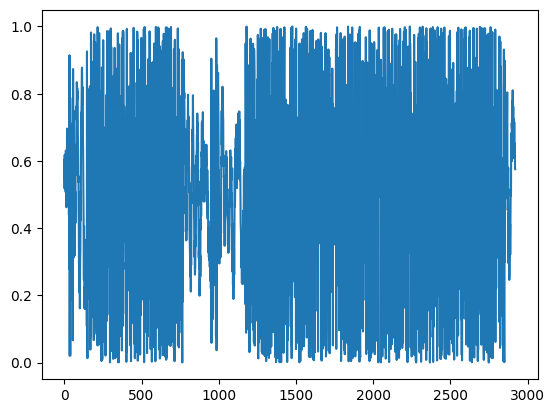

In [5]:
# Transform to uniform marginals
U_1t_sim = stats.norm.cdf(y_roll[p1:(len(y_roll)+1)], fitted_roll, np.sqrt(sigma2_to_exp(results1.x[-1]) ) ) #pnorm
data_sim = pd.DataFrame(U_1t_sim, columns = ["U_1t_sim"])
data_sim.to_csv("U_1t_roll_nods.csv")

plt.plot(U_1t_sim)
plt.show()

with "random" initials 

[-5.55675391e+00 -1.89733066e+01 -5.02649865e+01 -1.12126575e+02
 -2.19636772e+02 -3.87555596e+02 -6.26969975e+02 -9.40850953e+02
 -1.32009482e+03 -1.74166744e+03 -2.16815839e+03 -2.55049613e+03
 -2.83374494e+03 -2.96500732e+03 -2.90239435e+03 -2.62311320e+03
 -2.12954217e+03 -1.45115192e+03 -6.41945689e+02  2.26010046e+02
  1.07256051e+03  1.82058954e+03  2.40659504e+03  2.78929983e+03
  2.95379178e+03  2.91151489e+03  2.69628271e+03  2.35674724e+03
  1.94756607e+03  1.52092285e+03  1.11997479e+03  7.74616874e+02
  5.00079807e+02  2.98814069e+02  1.63343232e+02  8.02716165e+01
  3.45741851e+01  1.25202202e+01  3.54075211e+00  6.35235041e-01] 2.6881711403160233 1064070463188.1151
[-5.55675391e+00 -1.89733065e+01 -5.02649864e+01 -1.12126575e+02
 -2.19636772e+02 -3.87555595e+02 -6.26969974e+02 -9.40850951e+02
 -1.32009482e+03 -1.74166744e+03 -2.16815838e+03 -2.55049612e+03
 -2.83374493e+03 -2.96500731e+03 -2.90239434e+03 -2.62311320e+03
 -2.12954216e+03 -1.45115191e+03 -6.41945687e+02  2

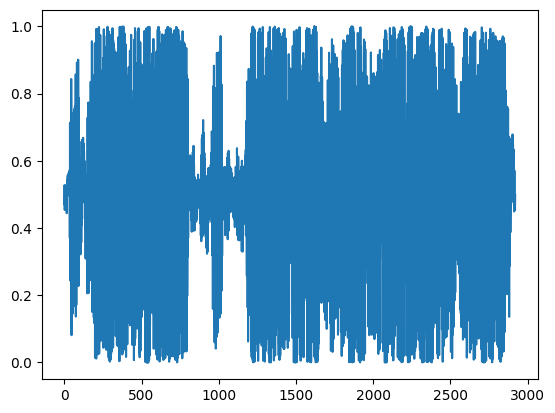

MSE of fitted to true for SARIMAX initials 6.577433680411366e-07
MSE of predicted to true for SARIMAX initials 1.366509877768337


In [6]:
#my fn
seed = 1
np.random.seed(seed)

param_i = [np.random.uniform() for i in range(p1+1)]

results1_np = minimize(neg_log_lik, param_i, args = ((y_roll, X_roll)), method = "L-BFGS-B")
print("psi approx",barndorff_schou_transformation(np.tanh(results1_np.x[0:p1])), "sigma2 approx",sigma2_to_exp(results1_np.x[-1]))
print("final negative log likelihood", results1_np.fun)

#forecast values 
phi_approx = barndorff_schou_transformation(np.tanh(results1_np.x[0:p1]))
forecast_noparam = predicting_values(y_roll, p1, N1, phi_approx, forecast_len = 125)

#fitting values 
phi_approx = np.array(phi_approx)
#phi_approx = sarimax_res.arparams # to check if identical fitting values
fitted_roll_np = fitting_values(y_roll,p1, phi_approx)

U_1t_sim = stats.norm.cdf(y_roll[p1:(len(y_roll)+1)], fitted_roll_np, np.sqrt(sigma2_to_exp(results1_np.x[-1]) ) ) #pnorm
data_sim = pd.DataFrame(U_1t_sim, columns = ["U_1t_sim"])
#data_sim.to_csv("U_1t.csv")

plt.plot(U_1t_sim)
plt.show()

#mse for fitted 
print("MSE of fitted to true for SARIMAX initials", mse(y_roll[p1:N1], fitted_roll_np))
print("MSE of predicted to true for SARIMAX initials", mse(y_test_roll , forecast_noparam))

In [7]:
#prepping graph arrays

sarimax_ci_down = sarimax_res1.get_forecast(125).summary_frame()["mean_ci_lower"]
sarimax_ci_up = sarimax_res1.get_forecast(125).summary_frame()["mean_ci_upper"]

y_graph = list(y_roll[-125:3000])
y_graph = y_graph + list(y_test_roll)

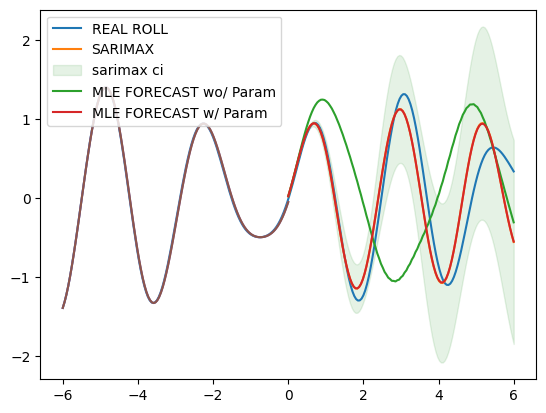

In [8]:
fig, ax = plt.subplots()
ax.plot(np.linspace(-6,6,250),y_graph)


ax.plot(np.linspace(0,6,125),sarimax_res1.forecast(125))
ax.fill_between(np.linspace(0,6,125), sarimax_ci_up, sarimax_ci_down, color='green', alpha=.1)

plt.plot(np.linspace(0,6,125),forecast_noparam)
plt.plot(np.linspace(0,6,125),forecast_param)
plt.plot(np.linspace(-6,0,125),fitted_roll_np[-125:3000])
plt.plot(np.linspace(-6,0,125),fitted_roll[-125:3000])



plt.legend([ "REAL ROLL","SARIMAX", "sarimax ci",  "MLE FORECAST wo/ Param", "MLE FORECAST w/ Param"])

plt.show()

fitting the incident wave to an ar 40 model 

In [9]:
y_test_incident = pd.read_csv("incident_filter_test.csv", header = None)
y_test_incident = y_test_incident[0]
p2 = 40 
y_incident = pd.read_csv("incident_filter_train.csv", header = None)
y_incident = y_incident[0]
N2 = len(y_incident)
np.random.seed(seed)

#create my x matrix
X_temp = pd.DataFrame()
for i in range(p2-1,0-1,-1):
    X = y_incident[(i):(N2-p2+i)]
    X_temp["lag"+str(p2-i)] = list(X) #has memory of its index 
X_incident = X_temp.to_numpy()
y_incident = np.array(y_incident[p2:N2])


In [10]:
sarimax_mod = SARIMAX(y_incident, order=(p2, 0, 0), trend="n")
sarimax_res2 = sarimax_mod.fit()
print(sarimax_res2.summary())

sarimax_params = sarimax_res2.arparams
results_as_html = sarimax_res2.summary().tables[1].as_html()
res_pd = pd.read_html(results_as_html, header=0, index_col=0)[0]
sarimax_sig = list(res_pd["coef"])[-1]
#sarimax_sig = np.var(sarimax_res2.resid)
non_restricted = np.arctanh(ARToPacf(sarimax_params))
param_i = list(non_restricted) + [exp_to_sigma2(sarimax_sig)]

c:\Users\danie\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2960
Model:              SARIMAX(40, 0, 0)   Log Likelihood               16241.458
Date:                Wed, 07 Aug 2024   AIC                         -32400.916
Time:                        17:58:46   BIC                         -32155.205
Sample:                             0   HQIC                        -32312.474
                               - 2960                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          5.9931      0.008    740.803      0.000       5.977       6.009
ar.L2        -14.8698      0.041   -365.586      0.000     -14.950     -14.790
ar.L3         17.7376      0.085    207.787      0.0

C:\Users\danie\AppData\Local\Temp\ipykernel_7928\2069546016.py:7: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  res_pd = pd.read_html(results_as_html, header=0, index_col=0)[0]


In [11]:
#my fn
np.random.seed(seed)
results2 = minimize(neg_log_lik, param_i, args = ((y_incident, X_incident)), method = "L-BFGS-B")
print("psi approx",barndorff_schou_transformation(np.tanh(results2.x[0:p2])), "sigma2 approx",sigma2_to_exp(results2.x[-1]))
print("final negative log likelihood", results2.fun)

#forecast values 
phi_approx = barndorff_schou_transformation(np.tanh(results2.x[0:p2]))
forecast_param_incident = predicting_values(y_incident, p2, N2, phi_approx, forecast_len = 125)

#fitting values 
phi_approx = barndorff_schou_transformation(np.tanh(results2.x[0:p2]))
phi_approx = np.array(phi_approx)
#phi_approx = sarimax_res.arparams # to check if identical fitting values
fitted_incident = fitting_values(y_incident,p2, phi_approx)

#mse for fitted 
print("MSE of fitted to true for SARIMAX initials", mse(y_incident[p2:N2], fitted_incident))
print("MSE of fitted to true for SARIMAX initials", mse(y_test_incident , forecast_param_incident))

[ 5.99309922e+00 -1.48697822e+01  1.77375808e+01 -6.14506969e+00
 -7.73953006e+00  5.43510483e+00  5.27057049e+00 -3.85372644e+00
 -4.29847138e+00  1.94572607e+00  3.86655512e+00 -1.34981260e-01
 -3.67371455e+00 -7.64766899e-01  2.56312195e+00  1.72090681e+00
 -1.43295118e+00 -2.14178471e+00  8.00697326e-03  2.65067818e+00
  5.66238215e-01 -2.19104176e+00 -8.88155903e-01  7.58261933e-01
  1.98076471e+00 -1.94853588e-01 -2.36512386e+00  1.35328496e-02
  1.97068154e+00 -1.14478296e-02 -5.38564361e-01 -1.62608778e+00
  1.71913071e+00  2.22628004e-01 -4.83193808e-01 -6.19132218e-01
  7.82690240e-01 -1.86168184e-01 -8.44081352e-02  3.68949496e-02] 9.719999999999998e-07 -15395.25748971094
[ 5.99309922e+00 -1.48697822e+01  1.77375808e+01 -6.14506969e+00
 -7.73953007e+00  5.43510483e+00  5.27057050e+00 -3.85372644e+00
 -4.29847138e+00  1.94572607e+00  3.86655512e+00 -1.34981260e-01
 -3.67371455e+00 -7.64766900e-01  2.56312195e+00  1.72090681e+00
 -1.43295118e+00 -2.14178472e+00  8.00697335e-03

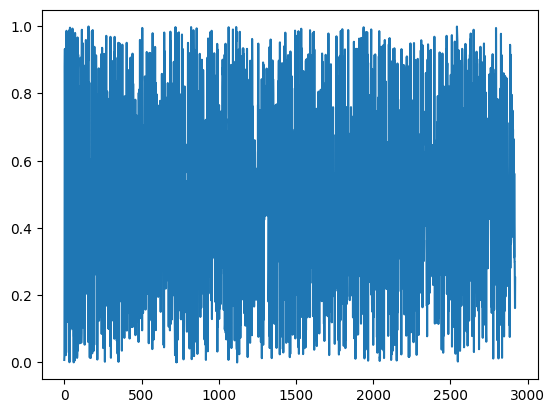

In [12]:
# Transform to uniform marginals
U_1t_sim = stats.norm.cdf(y_incident[p2:(len(y_incident)+1)], fitted_incident, np.sqrt(sigma2_to_exp(results2.x[-1]) ) ) #pnorm
data_sim = pd.DataFrame(U_1t_sim, columns = ["U_1t_sim"])
data_sim.to_csv("U_2t_incident_nods.csv")

plt.plot(U_1t_sim)
plt.show()

with "random" initials 

[-7.74917122e+00 -3.36814291e+01 -1.06950338e+02 -2.75602725e+02
 -6.08591491e+02 -1.18945110e+03 -2.10080586e+03 -3.40087788e+03
 -5.09600112e+03 -7.11582108e+03 -9.29897016e+03 -1.13965442e+04
 -1.30975262e+04 -1.40751476e+04 -1.40470157e+04 -1.28367535e+04
 -1.04223639e+04 -6.95811246e+03 -2.76248218e+03  1.72735448e+03
  6.02601864e+03  9.68067104e+03  1.23445490e+04  1.38278936e+04
  1.41165380e+04  1.33563159e+04  1.18093455e+04  9.79458491e+03
  7.62713952e+03  5.56916946e+03  3.80040163e+03  2.41044476e+03
  1.40957581e+03  7.51316540e+02  3.59070563e+02  1.50187128e+02
  5.29376651e+01  1.47546935e+01  2.88575068e+00  2.93419828e-01] 1.532497522983784 38774355697783.234
[-7.74917121e+00 -3.36814291e+01 -1.06950337e+02 -2.75602725e+02
 -6.08591490e+02 -1.18945110e+03 -2.10080586e+03 -3.40087788e+03
 -5.09600111e+03 -7.11582106e+03 -9.29897014e+03 -1.13965442e+04
 -1.30975262e+04 -1.40751475e+04 -1.40470156e+04 -1.28367535e+04
 -1.04223639e+04 -6.95811244e+03 -2.76248217e+03  1.

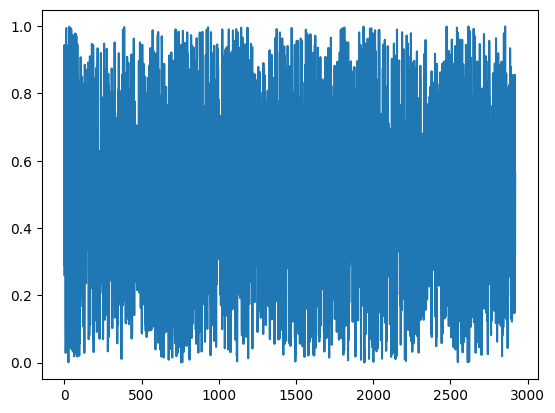

MSE of fitted to true for SARIMAX initials 2.495771082199764e-06
MSE of fitted to true for SARIMAX initials 3.513238614591996


In [13]:
#my fn
seed = 702209
np.random.seed(seed)

param_i = [np.random.uniform() for i in range(p2+1)]

results2_np = minimize(neg_log_lik, param_i, args = ((y_incident, X_incident)), method = "L-BFGS-B")
print("psi approx",barndorff_schou_transformation(np.tanh(results2_np.x[0:p2])), "sigma2 approx",sigma2_to_exp(results2_np.x[-1]))
print("final negative log likelihood", results2_np.fun)

#forecast values 
phi_approx = barndorff_schou_transformation(np.tanh(results2_np.x[0:p2]))
forecast_noparam_incident = predicting_values(y_incident, p2, N2, phi_approx, forecast_len = 125)

#fitting values 
phi_approx = np.array(phi_approx)
#phi_approx = sarimax_res.arparams # to check if identical fitting values
fitted_incident_np = fitting_values(y_incident,p2, phi_approx)

U_1t_sim = stats.norm.cdf(y_incident[p2:(len(y_incident)+1)], fitted_incident_np, np.sqrt(sigma2_to_exp(results2_np.x[-1]) ) ) #pnorm
data_sim = pd.DataFrame(U_1t_sim, columns = ["U_1t_sim"])
#data_sim.to_csv("U_1t.csv")

plt.plot(U_1t_sim)
plt.show()

#mse for fitted 
print("MSE of fitted to true for SARIMAX initials", mse(y_incident[p2:N2], fitted_incident_np))
print("MSE of fitted to true for SARIMAX initials", mse(y_test_incident , forecast_noparam_incident))

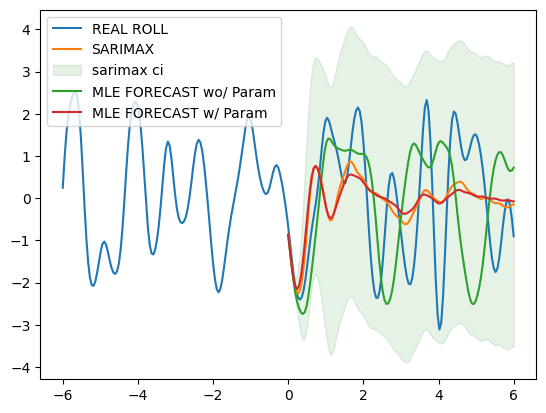

In [14]:
#prepping graph arrays

sarimax_ci_down = sarimax_res2.get_forecast(125).summary_frame()["mean_ci_lower"]
sarimax_ci_up = sarimax_res2.get_forecast(125).summary_frame()["mean_ci_upper"]

y_graph = list(y_incident[-125:3000])
y_graph = y_graph + list(y_test_incident)


fig, ax = plt.subplots()
ax.plot(np.linspace(-6,6,250),y_graph)


ax.plot(np.linspace(0,6,125),sarimax_res2.forecast(125))
ax.fill_between(np.linspace(0,6,125), sarimax_ci_up, sarimax_ci_down, color='green', alpha=.1)

plt.plot(np.linspace(0,6,125),forecast_noparam_incident)
plt.plot(np.linspace(0,6,125),forecast_param_incident)

plt.legend([ "REAL ROLL","SARIMAX", "sarimax ci",  "MLE FORECAST wo/ Param", "MLE FORECAST w/ Param"])

plt.show()

copula time

0       0.593562
1       0.604558
2       0.517788
3       0.618455
4       0.544003
          ...   
2915    0.652999
2916    0.638572
2917    0.646122
2918    0.576538
2919    0.575220
Name: U_1t_sim, Length: 2920, dtype: float64 0       0.007521
1       0.019909
2       0.295102
3       0.880157
4       0.932375
          ...   
2915    0.299336
2916    0.299196
2917    0.243492
2918    0.161887
2919    0.252148
Name: U_1t_sim, Length: 2920, dtype: float64


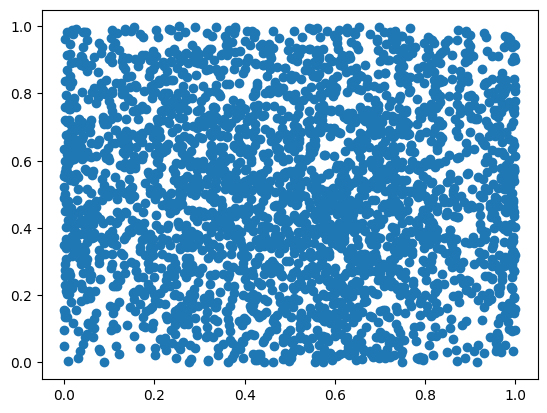

,U_1t,U_2t
count,2920.000000,2920.000000
mean,0.501972,0.500464
std,0.280191,0.263320
min,0.000122,0.000064
25%,0.276520,0.293706
50%,0.516002,0.496191
75%,0.722236,0.714476
max,0.999984,0.999109


In [15]:
U_1t = pd.read_csv("U_1t_roll_nods.csv")
U_1t = U_1t["U_1t_sim"]
U_2t = pd.read_csv("U_2t_incident_nods.csv")
U_2t = U_2t["U_1t_sim"]
print(U_1t, U_2t)
plt.scatter(U_1t, U_2t)
plt.show()
data = pd.DataFrame({"U_1t" : U_1t, "U_2t" : U_2t}) #tried reversing them: made no difference
display(data.describe())
data = data.to_numpy()

In [16]:
cop = copulae.archimedean.ClaytonCopula() #dim = 2 == default
cop.fit(data)
print(cop.summary())
print(cop.log_lik(data))

Clayton Copula Summary
Clayton Copula with 2 dimensions


Parameters
--------------------------------------------------------------------------------
       theta        : -0.03896416538413544

2.3104908393114316


In [17]:
from scipy import stats
tau = stats.kendalltau(data[:,0], data[:,1])[0]
tau
2 * tau / (1 - tau)

-0.030337063072806182

was getting issues for the negatives, so went positives only 

In [18]:
inita = exp_to_theta(2 * tau / (1 - tau) + 1) #sq_to_theta

#results = minimize(neg_log_clayton_pdf, [inita], args = ((rd1, rd2)), method = "nelder-mead")
results = minimize(neg_log_clayton_pdf, x0 = [inita], args = ((data[:,0], data[:,1])), method = "L-BFGS-B")

theta_to_exp(results.x +1) 

theta 2.6358171411794205
neg log clayton 3408.6188300873
theta 2.635817167537592
neg log clayton 3408.618880289908
theta 0.9696629369271941
neg log clayton 732.1752501229469
theta 0.9696629466238234
neg log clayton 732.175261719068
theta 0.718080264500967
neg log clayton 454.32276163101466
theta 0.7180802716817696
neg log clayton 454.32276886217227
theta 0.4365845904062303
neg log clayton 206.17873145416436
theta 0.43658459477207623
neg log clayton 206.17873470985955
theta 0.29046250667440643
neg log clayton 108.91354158991867
theta 0.2904625095790315
neg log clayton 108.91354327919115
theta 0.187168124041835
neg log clayton 55.57570130096852
theta 0.18716812591351623
neg log clayton 55.57570213969932
theta 0.12134559332209977
neg log clayton 29.20956871198352
theta 0.1213455945355557
neg log clayton 29.20956913778435
theta 0.07761573357477883
neg log clayton 15.439246787950406
theta 0.07761573435093616
neg log clayton 15.439247003189166
theta 0.04915469856647504
neg log clayton 8.3026

6.131966773372911e-05

Clayton Copula Summary
Clayton Copula with 2 dimensions


Parameters
--------------------------------------------------------------------------------
       theta        : 6.131966773372911e-05



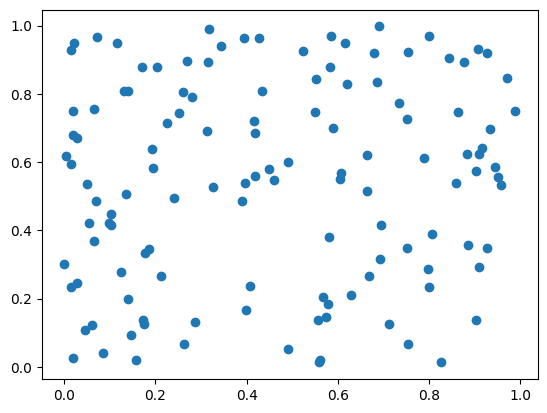

In [19]:
cop = copulae.archimedean.ClaytonCopula(theta = theta_to_exp(results.x +1) ) #dim = 2 == default
print(cop.summary())
u_gen = cop.random(125, seed = 1)

plt.scatter(u_gen[:,0], u_gen[:,1])

In [20]:
#import clayton
#from clayton.rng.archimedean import Clayton
#np.random.seed(10)
#cop = Clayton(theta=-0.028833624534288258, n_samples=125)
#u_gen = cop.sample_unimargin()
#
#plt.scatter(u_gen[:,0], u_gen[:,1])

In [21]:
#from statsmodels.distributions.copula.api import ClaytonCopula
#cop = ClaytonCopula(theta = -0.028833624534288258)
#cop.rvs(125, random_state =10)


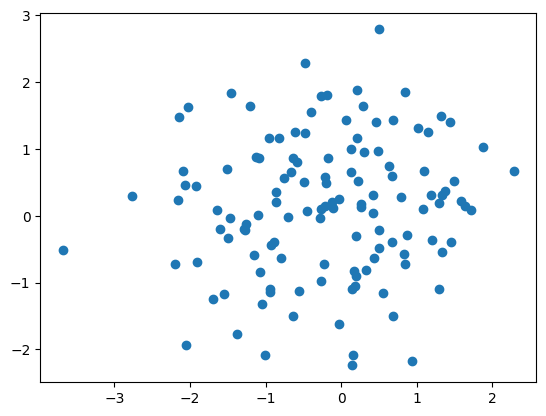

In [22]:
e_1t = stats.norm.ppf(u_gen[:,0])
e_2t = stats.norm.ppf(u_gen[:,1])
plt.scatter(e_1t, e_2t)

In [23]:
horizon = 125
repeats = 10000
pi_1, pi_2, forecast1_param_copula, forecast2_param_copula, pi_1b, pi_2b, forecast1b_param, forecast2b_param = predict_copula_pi(cop, y_roll, y_incident, results1, results2, p1, p2, N1, N2, repeats = repeats, horizon = horizon, seed = 10)

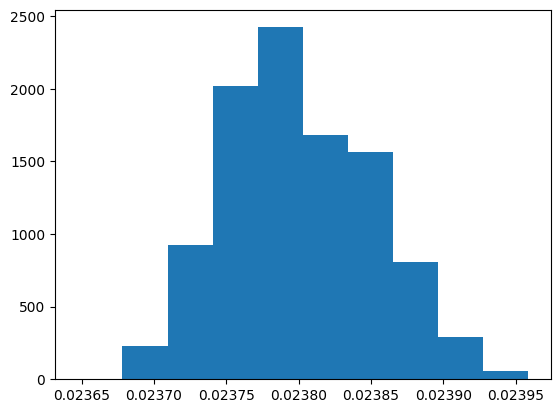

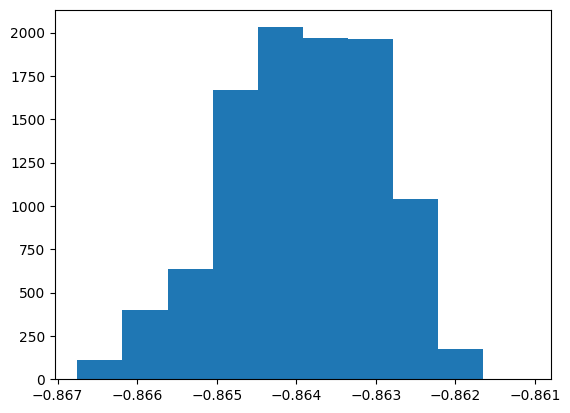

In [24]:
plt.hist(pi_1[0,:])
plt.show()
plt.hist(pi_2[0,:])
plt.show()

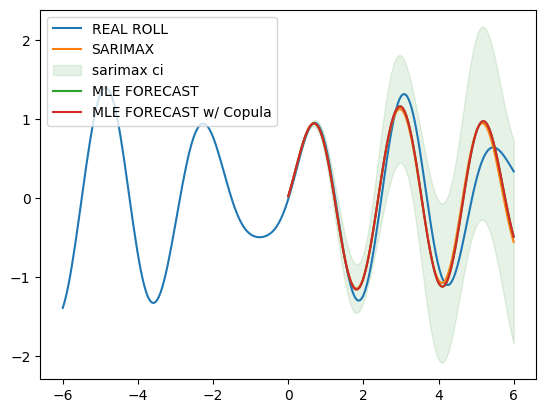

In [25]:
#importing data for graph 

y_graph1 = list(y_roll[-horizon:3000])
y_graph1 = y_graph1 + list(y_test_roll)

sarimax_ci_down1 = sarimax_res1.get_forecast(125).summary_frame()["mean_ci_lower"]
sarimax_ci_up1 = sarimax_res1.get_forecast(125).summary_frame()["mean_ci_upper"]


fig, ax = plt.subplots()
ax.plot(np.linspace(-6,6,250),y_graph1)

ax.plot(np.linspace(0,6,125),sarimax_res1.forecast(125))
ax.fill_between(np.linspace(0,6,125), sarimax_ci_up1, sarimax_ci_down1, color='green', alpha=.1)

plt.plot(np.linspace(0,6,125),forecast1b_param)
plt.plot(np.linspace(0,6,125),forecast1_param_copula)



plt.legend([ "REAL ROLL","SARIMAX", "sarimax ci",  "MLE FORECAST", "MLE FORECAST w/ Copula"])

plt.show()

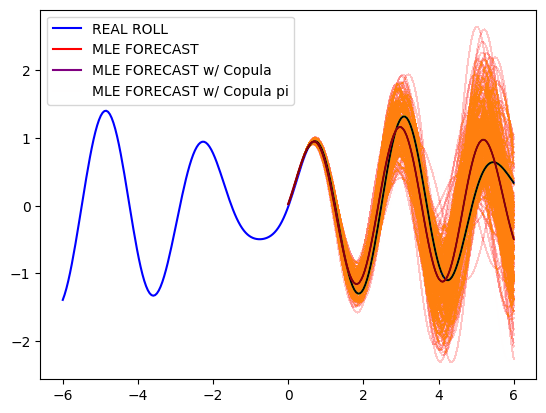

In [26]:
fig, ax = plt.subplots()

ax.plot(np.linspace(-6,6,250),y_graph1, color = "blue")
plt.plot(np.linspace(0,6,125),forecast1b_param, color = "red")
plt.plot(np.linspace(0,6,125),forecast1_param_copula, color = "purple")

for i in range(repeats):
    plt.plot(np.linspace(0,6,125),pi_1[:, i],color='C1', alpha=.002) #0.002


plt.legend([  "REAL ROLL",  "MLE FORECAST", "MLE FORECAST w/ Copula"  ,"MLE FORECAST w/ Copula pi"])

plt.show()

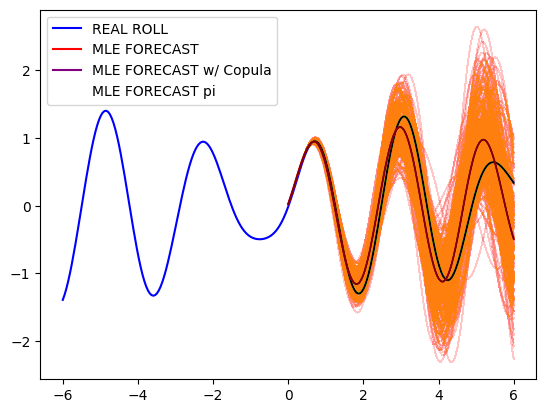

In [27]:
fig, ax = plt.subplots()

ax.plot(np.linspace(-6,6,250),y_graph1, color = "blue")
plt.plot(np.linspace(0,6,125),forecast1b_param, color = "red")
plt.plot(np.linspace(0,6,125),forecast1_param_copula, color = "purple")

for i in range(repeats):
    plt.plot(np.linspace(0,6,125),pi_1b[:, i],color='C1', alpha=.002) #0.002


plt.legend([  "REAL ROLL",  "MLE FORECAST", "MLE FORECAST w/ Copula"  ,"MLE FORECAST pi"])

plt.show()

In [56]:
print("MSE of predicted to true for MLE",mse(y_test_roll, forecast1b_param))
print("MSE of predicted to true for MLE w/ copula",mse(y_test_roll, forecast1_param_copula))

mse(forecast1b_param, forecast1_param_copula)

MSE of predicted to true for MLE [0.10987154]
MSE of predicted to true for MLE w/ copula 0.10987180178905012


array([2.87802177e-11])

In [29]:
y_graph2 = list(y_incident[-125:3000])
print(len(y_graph2), len(y_test_incident))
y_graph2 = y_graph2 + list(y_test_incident)

sarimax_ci_down2 = sarimax_res2.get_forecast(125).summary_frame()["mean_ci_lower"]
sarimax_ci_up2 = sarimax_res2.get_forecast(125).summary_frame()["mean_ci_upper"]

125 125


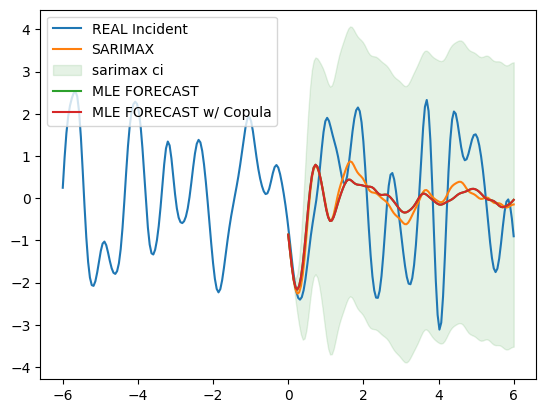

In [30]:
fig, ax = plt.subplots()
ax.plot(np.linspace(-6,6,250),y_graph2)

ax.plot(np.linspace(0,6,125),sarimax_res2.forecast(125))
ax.fill_between(np.linspace(0,6,125), sarimax_ci_up2, sarimax_ci_down2, color='green', alpha=.1)

plt.plot(np.linspace(0,6,125),forecast2b_param)
plt.plot(np.linspace(0,6,125),forecast2_param_copula)


plt.legend([ "REAL Incident", "SARIMAX", "sarimax ci",  "MLE FORECAST", "MLE FORECAST w/ Copula"])

plt.show()

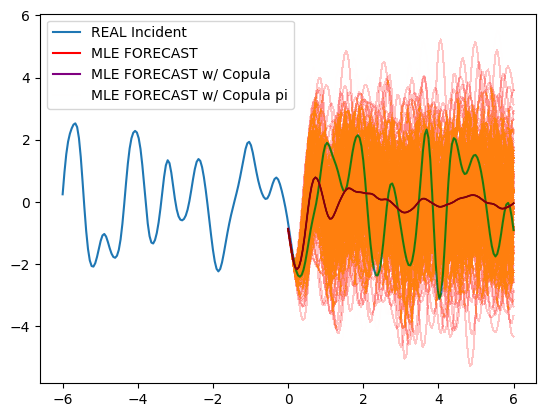

In [31]:
fig, ax = plt.subplots()
ax.plot(np.linspace(-6,6,250),y_graph2)
plt.plot(np.linspace(0,6,125),forecast2b_param, color = "red")
plt.plot(np.linspace(0,6,125),forecast2_param_copula, color = "purple")

for i in range(repeats):
    plt.plot(np.linspace(0,6,125),pi_2[:,i],color='C1', alpha=.002)

plt.legend([ "REAL Incident",  "MLE FORECAST", "MLE FORECAST w/ Copula","MLE FORECAST w/ Copula pi" ])

plt.show()

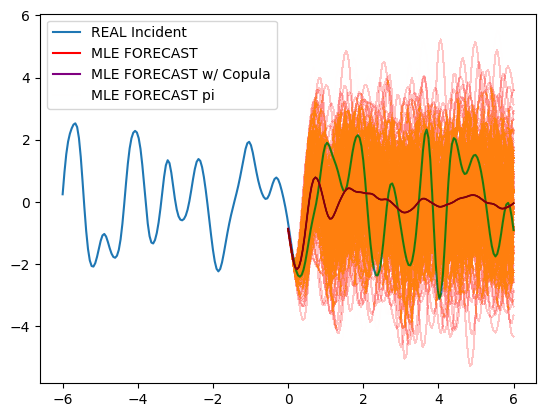

In [32]:
fig, ax = plt.subplots()
ax.plot(np.linspace(-6,6,250),y_graph2)
plt.plot(np.linspace(0,6,125),forecast2b_param, color = "red")
plt.plot(np.linspace(0,6,125),forecast2_param_copula, color = "purple")

for i in range(repeats):
    plt.plot(np.linspace(0,6,125),pi_2b[:,i],color='C1', alpha=.002)

plt.legend([ "REAL Incident",  "MLE FORECAST", "MLE FORECAST w/ Copula","MLE FORECAST pi" ])

plt.show()

In [55]:
print("MSE of predicted to true for MLE",mse(y_test_incident, forecast2b_param))
print("MSE of predicted to true for MLE w/ copula",mse(y_test_incident, forecast2_param_copula))
mse(forecast2b_param, forecast2_param_copula )

MSE of predicted to true for MLE [1.70839312]
MSE of predicted to true for MLE w/ copula 1.7083808875788502


array([1.21747243e-08])

frank copula

In [34]:
U_1t = pd.read_csv("U_1t_roll_nods.csv")
U_1t = U_1t["U_1t_sim"]
U_2t = pd.read_csv("U_2t_incident_nods.csv")
U_2t = U_2t["U_1t_sim"]

data = pd.DataFrame({"U_1t" : U_1t, "U_2t" : U_2t}) #tried reversing them: made no difference
data = data.to_numpy()

In [35]:
cop = copulae.archimedean.FrankCopula() #dim = 2 == default
cop.fit(data)
print(cop.summary())
print(cop.log_lik(data))

Frank Copula Summary
Frank Copula with 2 dimensions


Parameters
--------------------------------------------------------------------------------
       theta        : -0.1386460799909403

nan


In [36]:
print(cop.log_lik(data))

nan


In [37]:
results = minimize(neg_log_frank_pdf, x0 = [-0.13], args = ((data[:,0], data[:,1])), method = "L-BFGS-B")

theta [-0.13]
-2921.3290255262705
theta [-0.12999999]
-2921.3290254262447
theta [-1.13]
-2929.573134395908
theta [-1.12999999]
-2929.5731343310003
theta [-2.97825062]
-2936.6824711225017
theta [-2.97825061]
-2936.682471104533
theta [-3.68579259]
-2937.6235673887777
theta [-3.68579258]
-2937.623567379393
theta [-4.45930235]
-2938.129230236665
theta [-4.45930234]
-2938.1292302323764
theta [-5.11029026]
-2938.3323171065067
theta [-5.11029025]
-2938.3323171043094
theta [-5.79425929]
-2938.443664536875
theta [-5.79425928]
-2938.443664535669
theta [-6.62631704]
-2938.5246535465894
theta [-6.62631703]
-2938.524653545744
theta [-8.57687863]
-2938.7323649256928
theta [-8.57687862]
-2938.7323649241266
theta [-16.37912499]
-2945.4814691468646
theta [-16.37912498]
-2945.4814691291012
theta [-47.58811044]
-3006.6271836625783
theta [-47.58811043]
-3006.627183652948
theta [-84.5415734]
-3025.0754958188613
theta [-84.54157339]
-3025.0754958159487
theta [-232.35542522]
-3063.199067440407
theta [-232.35

In [38]:
results.x

array([-6.62631704])

Frank Copula Summary
Frank Copula with 2 dimensions


Parameters
--------------------------------------------------------------------------------
       theta        : -6.6263170353404846



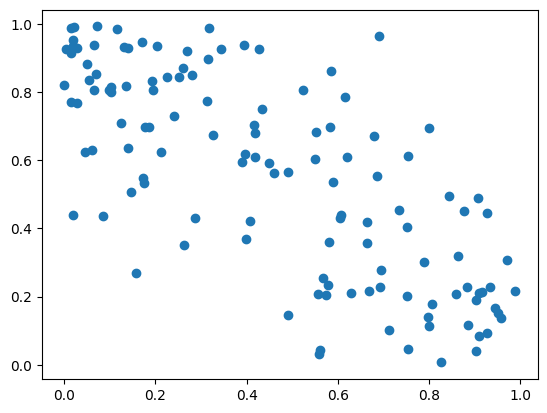

In [39]:
cop = copulae.archimedean.FrankCopula(theta = results.x)

print(cop.summary())
u_gen = cop.random(125, seed = 1)

plt.scatter(u_gen[:,0], u_gen[:,1])

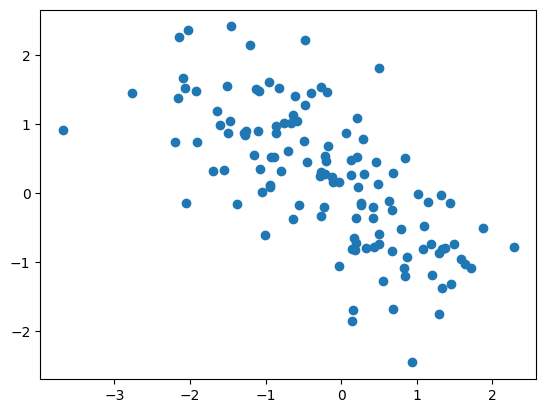

In [40]:
e_1t = stats.norm.ppf(u_gen[:,0])
e_2t = stats.norm.ppf(u_gen[:,1])
plt.scatter(e_1t, e_2t)

In [41]:
#import clayton
#from clayton.rng.archimedean import Frank
#np.random.seed(10)
#cop = Frank(theta=-1.2405718272534483, n_samples=125)
#u_gen = cop.sample_unimargin()
#
#plt.scatter(u_gen[:,0], u_gen[:,1])
#plt.show()
#e_1t = stats.norm.ppf(u_gen[:,0])
#e_2t = stats.norm.ppf(u_gen[:,1])
#plt.scatter(e_1t, e_2t)

In [42]:
horizon = 125
repeats = 10000
pi_1, pi_2, forecast1_param_copula, forecast2_param_copula, pi_1b, pi_2b, forecast1b_param, forecast2b_param = predict_copula_pi(cop, y_roll, y_incident, results1, results2, p1, p2, N1, N2, repeats = repeats, horizon = horizon, seed = 10)

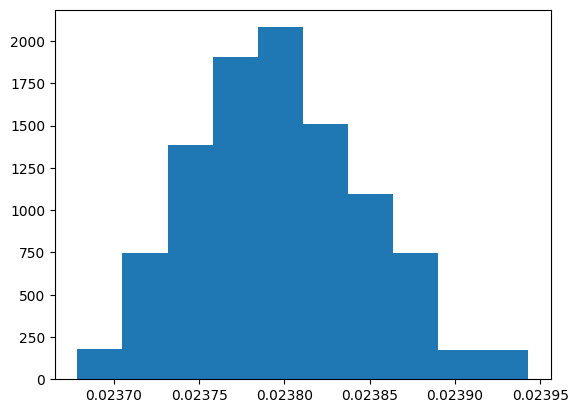

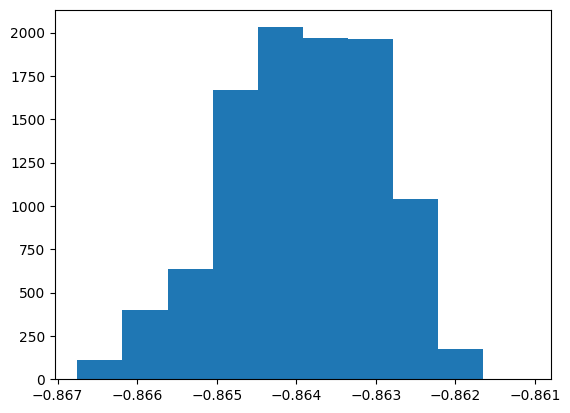

In [43]:
plt.hist(pi_1[0,:])
plt.show()
plt.hist(pi_2[0,:])
plt.show()

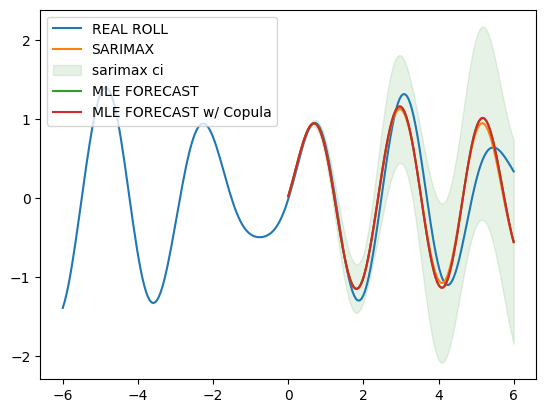

In [44]:
#importing data for graph 

y_graph1 = list(y_roll[-horizon:3000])
y_graph1 = y_graph1 + list(y_test_roll)

sarimax_ci_down1 = sarimax_res1.get_forecast(125).summary_frame()["mean_ci_lower"]
sarimax_ci_up1 = sarimax_res1.get_forecast(125).summary_frame()["mean_ci_upper"]


fig, ax = plt.subplots()
ax.plot(np.linspace(-6,6,250),y_graph1)

ax.plot(np.linspace(0,6,125),sarimax_res1.forecast(125))
ax.fill_between(np.linspace(0,6,125), sarimax_ci_up1, sarimax_ci_down1, color='green', alpha=.1)

plt.plot(np.linspace(0,6,125),forecast1b_param)
plt.plot(np.linspace(0,6,125),forecast1_param_copula)



plt.legend([ "REAL ROLL","SARIMAX", "sarimax ci",  "MLE FORECAST", "MLE FORECAST w/ Copula"])

plt.show()

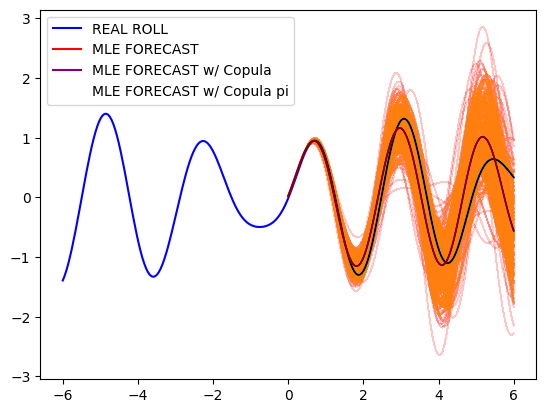

In [45]:
fig, ax = plt.subplots()

ax.plot(np.linspace(-6,6,250),y_graph1, color = "blue")
plt.plot(np.linspace(0,6,125),forecast1b_param, color = "red")
plt.plot(np.linspace(0,6,125),forecast1_param_copula, color = "purple")

for i in range(repeats):
    plt.plot(np.linspace(0,6,125),pi_1[:, i],color='C1', alpha=.002) #0.002


plt.legend([  "REAL ROLL",  "MLE FORECAST", "MLE FORECAST w/ Copula"  ,"MLE FORECAST w/ Copula pi"])

plt.show()

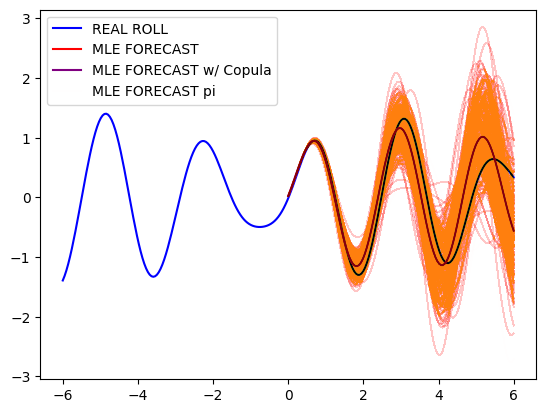

In [46]:
fig, ax = plt.subplots()

ax.plot(np.linspace(-6,6,250),y_graph1, color = "blue")
plt.plot(np.linspace(0,6,125),forecast1b_param, color = "red")
plt.plot(np.linspace(0,6,125),forecast1_param_copula, color = "purple")

for i in range(repeats):
    plt.plot(np.linspace(0,6,125),pi_1b[:, i],color='C1', alpha=.002) #0.002


plt.legend([  "REAL ROLL",  "MLE FORECAST", "MLE FORECAST w/ Copula"  ,"MLE FORECAST pi"])

plt.show()

In [54]:
print("MSE of predicted to true for MLE",mse(y_test_roll, forecast1b_param))
print("MSE of predicted to true for MLE w/ copula",mse(y_test_roll, forecast1_param_copula))

mse(forecast1b_param, forecast1_param_copula)

MSE of predicted to true for MLE [0.10987154]
MSE of predicted to true for MLE w/ copula 0.10987180178905012


array([2.87802177e-11])

In [48]:
y_graph2 = list(y_incident[-125:3000])
print(len(y_graph2), len(y_test_incident))
y_graph2 = y_graph2 + list(y_test_incident)

sarimax_ci_down2 = sarimax_res2.get_forecast(125).summary_frame()["mean_ci_lower"]
sarimax_ci_up2 = sarimax_res2.get_forecast(125).summary_frame()["mean_ci_upper"]

125 125


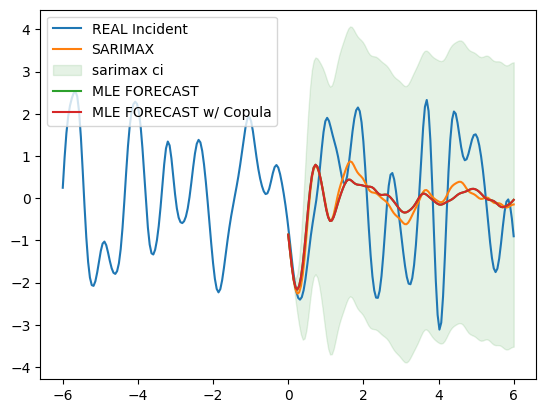

In [49]:
fig, ax = plt.subplots()
ax.plot(np.linspace(-6,6,250),y_graph2)

ax.plot(np.linspace(0,6,125),sarimax_res2.forecast(125))
ax.fill_between(np.linspace(0,6,125), sarimax_ci_up2, sarimax_ci_down2, color='green', alpha=.1)

plt.plot(np.linspace(0,6,125),forecast2b_param)
plt.plot(np.linspace(0,6,125),forecast2_param_copula)


plt.legend([ "REAL Incident", "SARIMAX", "sarimax ci",  "MLE FORECAST", "MLE FORECAST w/ Copula"])

plt.show()

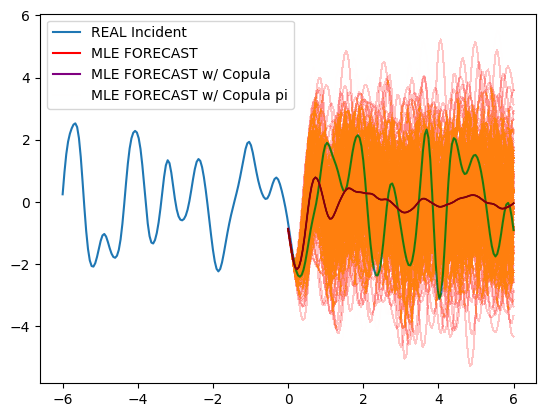

In [50]:
fig, ax = plt.subplots()
ax.plot(np.linspace(-6,6,250),y_graph2)
plt.plot(np.linspace(0,6,125),forecast2b_param, color = "red")
plt.plot(np.linspace(0,6,125),forecast2_param_copula, color = "purple")

for i in range(repeats):
    plt.plot(np.linspace(0,6,125),pi_2[:,i],color='C1', alpha=.002)

plt.legend([ "REAL Incident",  "MLE FORECAST", "MLE FORECAST w/ Copula","MLE FORECAST w/ Copula pi" ])

plt.show()

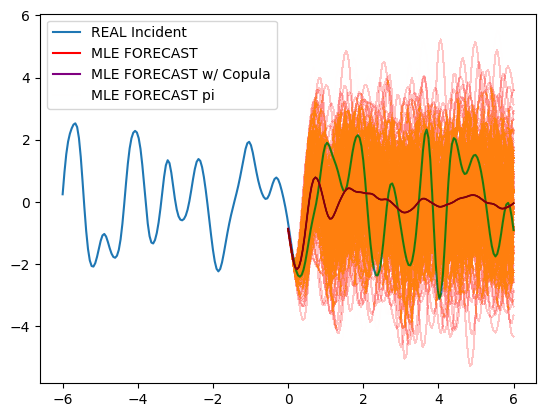

In [51]:
fig, ax = plt.subplots()
ax.plot(np.linspace(-6,6,250),y_graph2)
plt.plot(np.linspace(0,6,125),forecast2b_param, color = "red")
plt.plot(np.linspace(0,6,125),forecast2_param_copula, color = "purple")

for i in range(repeats):
    plt.plot(np.linspace(0,6,125),pi_2b[:,i],color='C1', alpha=.002)

plt.legend([ "REAL Incident",  "MLE FORECAST", "MLE FORECAST w/ Copula","MLE FORECAST pi" ])

plt.show()

In [53]:
print("MSE of predicted to true for MLE",mse(y_test_incident, forecast2b_param))
print("MSE of predicted to true for MLE w/ copula",mse(y_test_incident, forecast2_param_copula))
mse(forecast2b_param, forecast2_param_copula )

MSE of predicted to true for MLE [1.70839312]
MSE of predicted to true for MLE w/ copula 1.7083808875788502


array([1.21747243e-08])